## Title: A practical guide to generating and interpreting visualizations of shotgun proteomics data

#### Authors:
#### Pre-print:
#### Revision:

In [66]:
# Install all packages directly in the notebook
# !pip install pythonnet numpy pandas numba tqdm plotly alphatims holoviews psutil

In [68]:
# import all necessary libraries
import logging
import pandas as pd
import numpy as np
from numba import njit
from tqdm import tqdm
from pyrawfilereader import RawFileReader

import alphatims.bruker
# import alphaviz.plotting
import holoviews as hv
from holoviews import opts
from holoviews.operation.datashader import dynspread, rasterize, shade

import plotly.graph_objects as go

# specify a configuration whether to display the Plotly logo in the toolbar and how to save the plot
config = {
    'displaylogo': False,
    'toImageButtonOptions': {
        'format': 'svg', # one of png, svg, jpeg, webp
        'filename': 'custom_image',
        'height': 400,
        'width': 700,
        'scale': 1 # Multiply title/legend/axis/canvas sizes by this factor
      }
}

hv.extension('plotly')

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

The Thermo raw file is used from the [Project PXD010697 from ProteomeXchange](https://www.ebi.ac.uk/pride/archive/projects/PXD010697).

In [277]:
# specify a path to the Thermo .raw file
sample_path = ".../Data/PXD010697_circadian_clock/20170123_Qep6_ChRo_SA_collab_SYN_CT_phospho_1.raw"

In [278]:
# Necessary functions to read Thermo Raw file
# This code was used from the AlphaPept Python package (https://github.com/MannLabs/alphapept/blob/master/nbs/02_io.ipynb)

def load_thermo_raw(
    raw_file,
    most_abundant=1000
):
    """
    Load a Thermo raw file and extract all spectra
    """

    rawfile = RawFileReader(raw_file)

    spec_indices = np.array(
        range(rawfile.FirstSpectrumNumber, rawfile.LastSpectrumNumber + 1)
    )

    scan_list = []
    rt_list = []
    mass_list = []
    int_list = []
    ms_list = []
    prec_mzs_list = []
    mono_mzs_list = []
    charge_list = []

    for i in tqdm((spec_indices)):
        try:
            ms_order = rawfile.GetMSOrderForScanNum(i)
            rt = rawfile.RTFromScanNum(i)
            

            if ms_order == 2:
                prec_mz = rawfile.GetPrecursorMassForScanNum(i, 0)

                mono_mz, charge = rawfile.GetMS2MonoMzAndChargeFromScanNum(i)
            else:
                prec_mz, mono_mz, charge = 0,0,0

            masses, intensity = rawfile.GetCentroidMassListFromScanNum(i)
            if ms_order == 2:
                masses, intensity = get_most_abundant(masses, intensity, most_abundant)

            scan_list.append(i)
            rt_list.append(rt)
            mass_list.append(np.array(masses))
            int_list.append(np.array(intensity, dtype=np.int64))
            ms_list.append(ms_order)
            prec_mzs_list.append(prec_mz)
            mono_mzs_list.append(mono_mz)
            charge_list.append(charge)
        except KeyboardInterrupt as e:
            raise e
        except SystemExit as e:
            raise e
        except Exception as e:
            logging.info(f"Bad scan={i} in raw file '{raw_file}'")

    scan_list_ms1 = [scan_list[i] for i, _ in enumerate(ms_list) if _ == 1]
    rt_list_ms1 = [rt_list[i] for i, _ in enumerate(ms_list) if _ == 1]
    mass_list_ms1 = [mass_list[i] for i, _ in enumerate(ms_list) if _ == 1]
    int_list_ms1 = [int_list[i] for i, _ in enumerate(ms_list) if _ == 1]
    ms_list_ms1 = [ms_list[i] for i, _ in enumerate(ms_list) if _ == 1]

    scan_list_ms2 = [scan_list[i] for i, _ in enumerate(ms_list) if _ == 2]
    rt_list_ms2 = [rt_list[i] for i, _ in enumerate(ms_list) if _ == 2]
    mass_list_ms2 = [mass_list[i] for i, _ in enumerate(ms_list) if _ == 2]
    int_list_ms2 = [int_list[i] for i, _ in enumerate(ms_list) if _ == 2]
    ms_list_ms2 = [ms_list[i] for i, _ in enumerate(ms_list) if _ == 2]
    mono_mzs2 = [mono_mzs_list[i] for i, _ in enumerate(ms_list) if _ == 2]
    charge2 = [charge_list[i] for i, _ in enumerate(ms_list) if _ == 2]

    prec_mass_list2 = [
        calculate_mass(mono_mzs_list[i], charge_list[i])
        for i, _ in enumerate(ms_list)
        if _ == 2
    ]

    check_sanity(mass_list)

    data = {}
#     data['scan_list'] = np.array(scan_list)
#     data["rt_list"] = np.array(rt_list)
#     data['ms_list'] = np.array(ms_list)
#     data['int_list'] = np.array(int_list)
    
    data["scan_list_ms1"] = np.array(scan_list_ms1)
    data["rt_list_ms1"] = np.array(rt_list_ms1)
    data["mass_list_ms1"] = np.array(mass_list_ms1, dtype=object)
    data["int_list_ms1"] = np.array(int_list_ms1, dtype=object)
    data["ms_list_ms1"] = np.array(ms_list_ms1)

    data["scan_list_ms2"] = np.array(scan_list_ms2)
    data["rt_list_ms2"] = np.array(rt_list_ms2)
    data["mass_list_ms2"] = mass_list_ms2
    data["int_list_ms2"] = int_list_ms2
    data["ms_list_ms2"] = np.array(ms_list_ms2)
    data["prec_mass_list2"] = np.array(prec_mass_list2)
    data["mono_mzs2"] = np.array(mono_mzs2)
    data["charge_ms2"] = np.array(charge2)
    
    df = pd.DataFrame({'scan': scan_list_ms1, 
                   'RT': rt_list_ms1, 
                   'mz': mass_list_ms1})
    lst_col = 'mz'
    ms1 = pd.DataFrame({col:np.repeat(df[col].values, df[lst_col].str.len()) for col in df.columns.drop(lst_col)})
    ms1['mz'] = np.concatenate(mass_list_ms1)
    ms1['intensity'] = np.concatenate(int_list_ms1)
    
    rawfile.Close()
    return data, ms1

def get_most_abundant(
    mass, 
    intensity, 
    n_max
):
    """
    Returns the n_max most abundant peaks of a spectrum.
    Setting `n_max` to -1 returns all peaks.
    """
    if n_max == -1:
        return mass, intensity
    if len(mass) < n_max:
        return mass, intensity
    else:
        sortindex = np.argsort(intensity)[::-1][:n_max]
        sortindex.sort()

    return mass[sortindex], intensity[sortindex]

@njit
def calculate_mass(
    mono_mz, 
    charge
):
    """
    Calculate the precursor mass from mono mz and charge
    """
    M_PROTON = 1.00727646687
    prec_mass = mono_mz * abs(charge) - charge * M_PROTON

    return prec_mass

def check_sanity(
    mass_list
):
    """
    Sanity check for mass list to make sure the masses are sorted
    """
    if not all(
        mass_list[0][i] <= mass_list[0][i + 1] for i in range(len(mass_list[0]) - 1)
    ):
        raise ValueError("Masses are not sorted.")

In [279]:
# upload the thermo raw file
data, ms1 = load_thermo_raw(sample_path)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54493/54493 [01:55<00:00, 472.52it/s]


In [281]:
# save ms1 and ms2 data separately 
df_ms1 = pd.DataFrame({'scan': data['scan_list_ms1'], 
                    'RT': data['rt_list_ms1'],
                   'intensity': data['int_list_ms1'],
                    'order': 'ms1'})

In [282]:
# calculate summed and max intensity per each scan
df_ms1['summed_intensity'] = df_ms1.intensity.apply(lambda x: sum(x))
df_ms1['max_intensity'] = df_ms1.intensity.apply(lambda x: max(x))

In [283]:
def plot_tic(
    df: pd.DataFrame, 
    title: str, 
    width: int = 900,
    height: int = 500
):
    """Create a total ion chromatogram (TIC) and Base Peak chromatogram (BPI) for the MS1 data.

    Parameters
    ----------
    df : pandas Dataframe
        A table with the extracted MS1 data.
    title : str
        The title of the plot.
        Default is False
    width : int
        The width of the plot.
        Default is 1000.
    height : int
        The height of the plot.
        Default is 320.

    Returns
    -------
    a Plotly line plot
        The line plot containing TIC and BPI for MS1 data of the provided dataset.
    """
    fig = go.Figure()
    
    total_ion_col = ['RT', 'summed_intensity']
    base_peak_col = ['RT', 'max_intensity']
    
    for chrom_type in ['TIC MS1', 'BPI MS1']:
        if chrom_type == 'TIC MS1':
            data = df[total_ion_col]
        elif chrom_type == 'BPI MS1':
            data = df[base_peak_col]
        fig.add_trace(
            go.Scatter(
                x=data.iloc[:, 0],
                y=data.iloc[:, 1],
                name=chrom_type,
                hovertemplate='<b>RT:</b> %{x};<br><b>Intensity:</b> %{y}.',
            )
        )
    
    fig.update_layout(
        title=dict(
            text=title,
            font=dict(
                size=16,
            ),
            x=0.5,
            xanchor='center',
            yanchor='top'
        ),
        xaxis=dict(
            title='RT, min',
            titlefont_size=14,
            tickmode = 'auto',
            tickfont_size=14,
        ),
        yaxis=dict(
            title='Intensity',
        ),
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1
        ),
        legend_title_text='Select:',
        hovermode="x",
        template="plotly_white",
        width=width,
        height=height
    )

    fig.update_xaxes(range=[0, df.RT.max()])
    return fig
    

## Figure 1 A: TIC and BPI

In [284]:
plot_tic(df_ms1, 'Chromatogram').show(config=config)

## Figure 1 B: MS1 feature map

In [58]:
path_to_features_mq_file = '../Data/20190402_QX1_SeVW_MA_HeLa_500ng_LC11.features.tsv'

In [59]:
features = pd.read_csv(path_to_features_mq_file, sep='\t')
features.head()

,mz,mostAbundantMz,charge,rtStart,rtApex,rtEnd,fwhm,nIsotopes,nScans,averagineCorr,mass,massCalib,intensityApex,intensitySum
0,401.848359,401.848359,3,1.407345,1.437862,1.485042,0.087918,2,19,0.758352,1202.515967,1202.515603,333899.279297,5.775192e+06
1,414.837956,414.837956,1,1.376529,1.450545,1.523679,0.263146,2,37,0.999643,413.830402,413.830372,412544.174316,1.262690e+07
2,476.198018,476.198018,1,1.376529,1.435587,1.488920,0.499391,3,28,0.973631,475.188811,475.188842,741800.526855,1.798006e+07
3,493.838298,493.838298,1,1.416147,1.445596,1.485042,0.025322,2,13,0.964025,492.830950,492.830919,244041.166626,3.760315e+06
4,550.216764,550.216764,1,1.420375,1.455440,1.531359,0.126799,3,28,0.997846,549.208431,549.208429,482958.627930,1.512900e+07


In [60]:
features.columns

Index(['mz', 'mostAbundantMz', 'charge', 'rtStart', 'rtApex', 'rtEnd', 'fwhm',
       'nIsotopes', 'nScans', 'averagineCorr', 'mass', 'massCalib',
       'intensityApex', 'intensitySum'],
      dtype='object')

In [74]:
features['id'] = features.index
features_long = features.melt(id_vars=['mz', 'mostAbundantMz', 'charge', 'fwhm',
       'nIsotopes', 'nScans', 'averagineCorr', 'mass', 'massCalib',
       'intensityApex', 'intensitySum', 'id'], var_name='RT_posit', value_name='RT')
features_long.sort_values(['id', 'mostAbundantMz'], inplace=True)
features_long

,mz,mostAbundantMz,charge,fwhm,nIsotopes,nScans,averagineCorr,mass,massCalib,intensityApex,intensitySum,id,RT_posit,RT
0,401.848359,401.848359,3,0.087918,2,19,0.758352,1202.515967,1202.515603,3.338993e+05,5.775192e+06,0,rtStart,1.407345
245940,401.848359,401.848359,3,0.087918,2,19,0.758352,1202.515967,1202.515603,3.338993e+05,5.775192e+06,0,rtApex,1.437862
491880,401.848359,401.848359,3,0.087918,2,19,0.758352,1202.515967,1202.515603,3.338993e+05,5.775192e+06,0,rtEnd,1.485042
1,414.837956,414.837956,1,0.263146,2,37,0.999643,413.830402,413.830372,4.125442e+05,1.262690e+07,1,rtStart,1.376529
245941,414.837956,414.837956,1,0.263146,2,37,0.999643,413.830402,413.830372,4.125442e+05,1.262690e+07,1,rtApex,1.450545
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
491878,681.565688,681.565688,1,0.060451,2,8,0.997346,680.558476,680.558423,4.875036e+06,3.295690e+07,245938,rtApex,117.725792
737818,681.565688,681.565688,1,0.060451,2,8,0.997346,680.558476,680.558423,4.875036e+06,3.295690e+07,245938,rtEnd,117.748590
245939,355.348759,355.348759,1,0.177596,2,13,0.988336,354.339086,354.338861,2.702862e+06,3.218517e+07,245939,rtStart,117.684745
491879,355.348759,355.348759,1,0.177596,2,13,0.988336,354.339086,354.338861,2.702862e+06,3.218517e+07,245939,rtApex,117.724693


In [65]:
def plot_heatmap(
    df: pd.DataFrame,
    x_axis_label: str,
    y_axis_label: str,
    z_axis_label: str = "Intensity",
    title: str = "",
    width: int = 550,
    height: int = 450,
    background_color: str = "white",
    colormap: str = 'Blues',
    **kwargs,
):
    labels = {
        'Intensity': "intensityApex",
        'm/z': 'mz',
        'RT': 'rtApex'
    }

    x_dimension = labels[x_axis_label]
    y_dimension = labels[y_axis_label]
    z_dimension = labels[z_axis_label]

    def hook(plot, element):
        plot.handles['layout']['xaxis']['gridcolor'] = background_color
        plot.handles['layout']['yaxis']['gridcolor'] = background_color

    opts_ms1=dict(
        width=width,
        height=height,
        title=title,
        xlabel=x_axis_label,
        ylabel=y_axis_label,
        bgcolor=background_color,
        hooks=[hook],
    )
    dmap = hv.DynamicMap(
        hv.Points(
            df,
            [x_dimension, y_dimension],
            z_dimension
        )
    )
    agg = rasterize(
        dmap,
        width=width,
        height=height,
        aggregator='sum'
    )
    fig = dynspread(
        shade(
            agg,
            cmap=colormap
        )
    ).opts(plot=opts_ms1)

    return fig

:DynamicMap   []
   :RGB   [mz,rtApex]   (R,G,B,A)
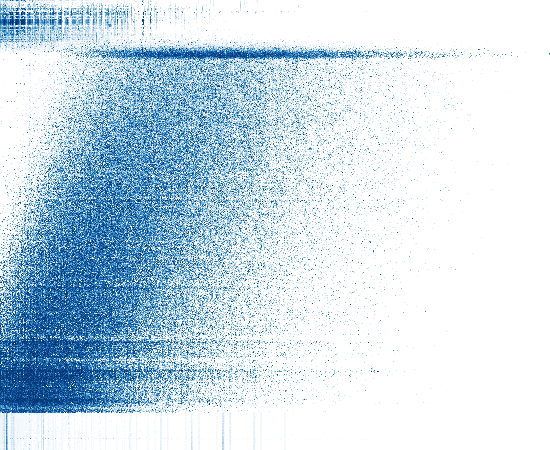

In [66]:
plot_heatmap(features, x_axis_label='m/z', y_axis_label='RT', z_axis_label='Intensity')

In [67]:
import datashader as ds
cvs = ds.Canvas(plot_width=1000, plot_height=320)
agg = cvs.points(features_long, x='mz', y='RT', agg=getattr(ds, 'sum')('intensitySum'))
import datashader.transfer_functions as tf
img = tf.shade(agg, cmap=['lightblue', 'darkblue'])

import plotly.express as px
# Trick to create rapidly a figure with mapbox axes
fig = px.imshow(img, origin='lower')#.to_pil()
fig.update_layout(
    title=dict(
        text=f"Heatmap",
        font=dict(
            size=16,
#                 color="RebeccaPurple"
        ),
        y=0.91,
        x=0.5,
        xanchor='center',
        yanchor='top'
    ),
)
fig.show()

## Figure 1 C: XIC

In [285]:
ms1.head()

,scan,RT,mz,intensity
0,1,0.002888,339.826355,397
1,1,0.002888,353.999969,408
2,1,0.002888,393.317078,431
3,1,0.002888,438.728851,445
4,1,0.002888,509.966522,395


In [287]:
def sum_binned_data(rt_values, intensity_values, min_value, max_value, bins):
    bin_delta = (max_value - min_value) / bins
    bins_array = np.linspace(min_value, max_value, bins+1)
    rt_bins = ((rt_values - min_value) / bin_delta).astype(np.int64)
    intensity_bins = np.zeros(bins+1, dtype=np.int64)
    for rt_bin, intensity in zip(rt_bins, intensity_values):
        intensity_bins[rt_bin] += intensity
        bin_centers = bins_array[1:] - bin_delta/2
    return bin_centers, intensity_bins[1:]

In [298]:
def plot_xic(
    df: pd.DataFrame, 
    xic_mz: float,
    mz_tol_value: int,
    rt_min: float,
    rt_max: float,
    bins: int,
    width: int = 900,
    height: int = 500
):
    """Create an Extracted ion chromatogram (XIC) for the selected m/z.

    Parameters
    ----------
    df : pandas Dataframe
        A table with the extracted MS1 data.
    xic_mz : float
        An m/z value of the precursor/feature that should be used for the XIC.
    mz_tol_value : int
        An m/z tolerance value in ppm.
    rt_min : float
        Start of retention time window.
    rt_max : float
        End of retention time window.
    bins: int
        Number of bins for the plot's creation.
    width : int
        The width of the plot.
        Default is 1000.
    height : int
        The height of the plot.
        Default is 320.

    Returns
    -------
    a Plotly line plot
        The line plot showing XIC for the selected m/z of the provided dataset.
    """
    fig = go.Figure()
    
    xic_mz_low_mz = xic_mz / (1 + mz_tol_value / 10**6)
    xic_mz_high_mz = xic_mz * (1 + mz_tol_value / 10**6)

    d = df[(df.mz >= xic_mz_low_mz) & (df.mz <= xic_mz_high_mz)]

    bin_centers, intensity_bins = sum_binned_data(d.RT, d.intensity, rt_min, rt_max, bins)
    
    fig.add_trace(
        go.Scatter(
            x=bin_centers,
            y=intensity_bins,
            hovertemplate='<b>RT:</b> %{x};<br><b>Intensity:</b> %{y}.',
        )
    )
    
    fig.update_layout(
        title=dict(
            text=f'XIC for the m/z = {xic_mz}, m/z tolerance = {mz_tol_value} ppm.',
            font=dict(
                size=16,
            ),
            x=0.5,
            xanchor='center',
            yanchor='top'
        ),
        xaxis=dict(
            title='RT, min',
            titlefont_size=14,
            tickmode = 'auto',
            tickfont_size=14,
        ),
        yaxis=dict(
            title='Intensity',
        ),
        hovermode="x",
        template="plotly_white",
        width=width,
        height=height
    )

    fig.update_xaxes(range=[0, df.RT.max()])
    return fig

In [299]:
plot_xic(df=ms1, xic_mz=478.7797711, mz_tol_value=10, rt_min=0, rt_max=ms1.RT.max(), bins=100)

## Figure 1 D: m/z vs. IM heatmap

The Bruker raw file is used from the [Project PXD017703 from ProteomeXchange](https://www.ebi.ac.uk/pride/archive/projects/PXD017703).

To read the raw TIMS-TOF data we will use a recently published [AlphaTims package](https://github.com/MannLabs/alphatims).

In [13]:
file_path = '../Data/PXD017703_diaPASEF/20200428_Evosep_60SPD_SG06-16_MLHeLa_200ng_py8_S3-A6_1_2452.d'

In [14]:
raw_data = alphatims.bruker.TimsTOF(file_path)

100%|███████████████████████████████████████████████████████████| 11872/11872 [00:22<00:00, 516.35it/s]


In [70]:
# this function is taken from the AlphaViz package (https://github.com/MannLabs/alphaviz) and modified
def plot_heatmap(
    df: pd.DataFrame,
    x_axis_label: str = 'm/z, Th',
    y_axis_label: str = 'Inversed IM, V·s·cm\u207B\u00B2',
    z_axis_label: str = "Intensity",
    title: str = "",
    width: int = 700,
    height: int = 400,
    background_color: str = "black",
    precursor_color: str = 'white',
    precursor_size: int = 15,
    colormap: str = 'fire',
    **kwargs,
):
    labels = {
        'm/z, Th': "mz_values",
        'RT, min': "rt_values",
        'Inversed IM, V·s·cm\u207B\u00B2': "mobility_values",
        'Intensity': "intensity_values",
    }
    x_dimension = labels[x_axis_label]
    y_dimension = labels[y_axis_label]
    z_dimension = labels[z_axis_label]

    df["rt_values"] /= 60

    def hook(plot, element):
        plot.handles['layout']['xaxis']['gridcolor'] = background_color
        plot.handles['layout']['yaxis']['gridcolor'] = background_color

    opts_ms1=dict(
        width=width,
        height=height,
        title=title,
        xlabel=x_axis_label,
        ylabel=y_axis_label,
        bgcolor=background_color,
        hooks=[hook],
    )
    dmap = hv.DynamicMap(
        hv.Points(
            df,
            [x_dimension, y_dimension],
            z_dimension
        )
    )
    agg = rasterize(
        dmap,
        width=width,
        height=height,
        aggregator='sum'
    )
    fig = dynspread(
        shade(
            agg,
            cmap=colormap
        )
    ).opts(plot=opts_ms1)

    return fig

In [71]:
raw_data[6004]

,raw_indices,frame_indices,scan_indices,precursor_indices,push_indices,tof_indices,rt_values,mobility_values,quad_low_mz_values,quad_high_mz_values,mz_values,intensity_values
0,279083635,6004,33,0,5517709,211464,633.716165,1.601114,-1.0,-1.0,694.773080,9
1,279083636,6004,35,0,5517711,326378,633.716165,1.598886,-1.0,-1.0,1252.148662,9
2,279083637,6004,36,0,5517712,35698,633.716165,1.597771,-1.0,-1.0,157.530243,9
3,279083638,6004,36,0,5517712,50307,633.716165,1.597771,-1.0,-1.0,187.655130,9
4,279083639,6004,36,0,5517712,64580,633.716165,1.597771,-1.0,-1.0,219.631055,9
...,...,...,...,...,...,...,...,...,...,...,...,...
379511,279463146,6004,916,0,5518592,182636,633.716165,0.602828,-1.0,-1.0,580.518001,73
379512,279463147,6004,916,0,5518592,253798,633.716165,0.602828,-1.0,-1.0,881.147624,93
379513,279463148,6004,917,0,5518593,184218,633.716165,0.601681,-1.0,-1.0,586.522010,78
379514,279463149,6004,917,0,5518593,6192,633.716165,0.601681,-1.0,-1.0,104.719141,100


:DynamicMap   []
   :RGB   [mz_values,mobility_values]   (R,G,B,A)
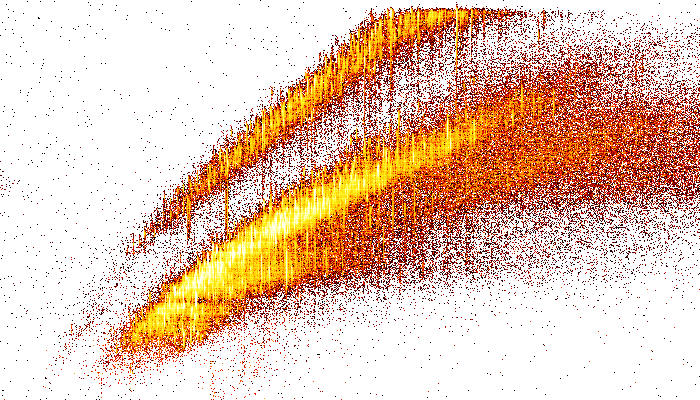

In [73]:
# this heatmap is generated for the MS1 frame № 6004 in the middle of the gradient
plot_heatmap(raw_data[6004], title='Heatmap')